# Environment

## Libraries

In [1]:
import os, subprocess, json, requests, getpass, urllib.parse, sys, pathlib, warnings, numpy as np, \
pandas_profiling,seaborn as sns, pandas as pd, matplotlib.pyplot as plt, google.cloud.bigquery as bigquery

from bs4 import BeautifulSoup
from astropy.visualization import hist as astro_hist
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

## Specifying the Working Directory

In [2]:
workingdir=os.getcwd()
d=[d for d in os.listdir(workingdir)]
n=0
while not set(['notebook']).issubset(set(d)):
    workingdir=str(pathlib.Path(workingdir).parents[0])

    d=[d for d in os.listdir(str(workingdir))]
    n+=1
    if n>5:
        break
sys.path.insert(0, workingdir)
os.chdir(workingdir)

## Dealing with Warnings

In [3]:
pd.set_option('mode.chained_assignment', None)

## Function Definitions

In [4]:
def create_wordcloud(df: pd.DataFrame, what: str):
    posts = df[['body']].apply(lambda x: ' '.join(x), axis=0)[0]
    soup = BeautifulSoup(posts, 'html.parser')
    obj_array = soup.find_all(what)
    text = ''
    
    for obj in obj_array:
        text += obj.text
    
    stopwords = set(STOPWORDS)
    wordcloud_obj = WordCloud(stopwords=stopwords).generate(text)
    
    return(wordcloud_obj)

In [5]:
def split_tags(tags: str) -> list:
    return tags.split('|')

## Specifying GCP-Related Variables 

In [6]:
os.environ['PROJECT_ID'] = subprocess.run('gcloud config list project --format "value(core.project)"', 
                                          shell=True, check=True, stdout=subprocess.PIPE) \
                                            .stdout.decode().replace('\n', '').replace('\r', '')
print(os.environ['PROJECT_ID'])

axa-ch-machine-learning-dev


In [7]:
os.environ['BUCKET_NAME']='axa-ch-machine-learning-poc-dev'

In [8]:
try:
    tmp=os.environ['PROJECT_ID']
except:
    print('Env variable PROJECT not defined!') 

try:
    tmp=os.environ['BUCKET_NAME']
except:
    print('Env variable BUCKET_NAME not defined!') 
    
try:    
    tmp=os.environ['GOOGLE_APPLICATION_CREDENTIALS']
except:
    print('Env variable GOOGLE_APPLICATION_CREDENTIALS not defined!') 

try:
    tmp=os.environ['REQUESTS_CA_BUNDLE']
except:
    print('Env variable REQUESTS_CA_BUNDLE not defined!') 

try:
    tmp=os.environ['AXA_CH_CA_BUNDLE']
except:
    print('Env variable AXA_CA_CA_BUNDLE not defined!') 

## Does the Connection Work?

In [9]:
use_proxy='Y'
proxies = {
    'https': os.environ['HTTPS_PROXY'],    
    'http': os.environ['HTTP_PROXY']
}  

In [10]:
list_url=['https://www.google.com',
          'http://www.google.com',
          'https://www.example.com',
          'http://www.example.com',
          'https://github.com/j0hannes/cutter-ng']

for url in list_url:
    print('')
    print('trying to access:'+url)
    try:
        if use_proxy=='N':
            r = requests.get(url)
        else:
            # SSL deactivated
            #r = requests.get(url,proxies=proxies,verify=False)
            r = requests.get(url,proxies=proxies,verify=True)
            
        if r.status_code == requests.codes.ok:
            print('=>OK',r.headers['content-type'])
        else:
            # 407 Proxy Authentication Required
            print ('=> ??', r.status_code)
    except Exception as inst:
        print('=>FAILED')
        print(type(inst))    # the exception instance
        print(inst.args)     # arguments stored in .args
        print(inst)


trying to access:https://www.google.com
=>OK text/html; charset=ISO-8859-1

trying to access:http://www.google.com
=>OK text/html; charset=ISO-8859-1

trying to access:https://www.example.com
=>OK text/html; charset=UTF-8

trying to access:http://www.example.com
=>OK text/html; charset=UTF-8

trying to access:https://github.com/j0hannes/cutter-ng
=>OK text/html; charset=utf-8


# Exploratory Data Analysis

In [11]:
client = bigquery.Client()

## Tags

<a href='https://stackoverflow.com/help/tagging' target='_blank'>What are tags, and how should I use them?</a>

In [12]:
query = """SELECT
 *
FROM
  `bigquery-public-data.stackoverflow.tags`
ORDER BY
  count desc"""
df_tags = client.query(query).to_dataframe()

### How are the Tags Distributed?

In [13]:
features = ['count']

In [14]:
df_tags[features].describe()

,count
count,5.566500e+04
mean,9.661615e+02
std,1.810551e+04
min,1.000000e+00
25%,1.000000e+01
50%,3.900000e+01
75%,1.650000e+02
max,1.862833e+06


[(0, 600), Text(0, 0.5, 'Number of Tags'), Text(0.5, 0, 'Occurences')]

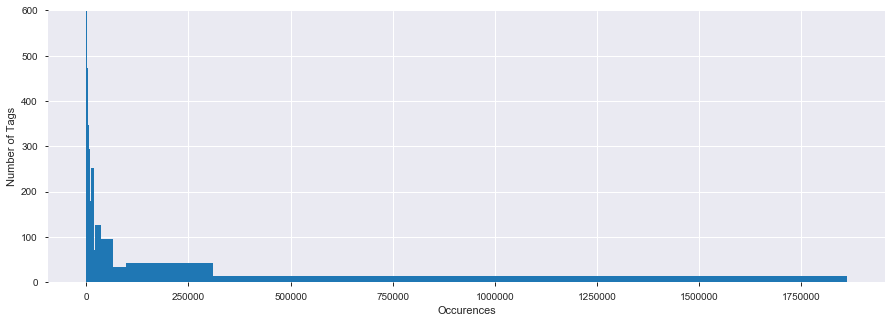

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

astro_hist(df_tags['count'], 
           bins='blocks', 
           histtype='stepfilled');

ax.set(ylim=[0,600], xlabel='Occurences', ylabel='Number of Tags')

### Which Tags Are Most Frequent?

In [16]:
df_tags.head()

,id,tag_name,count,excerpt_post_id,wiki_post_id
0,3,javascript,1862833,3624960.0,3607052.0
1,17,java,1581854,3624966.0,3607018.0
2,9,c#,1339575,3624962.0,3607007.0
3,5,php,1303327,3624936.0,3607050.0
4,16,python,1236812,3624965.0,3607014.0


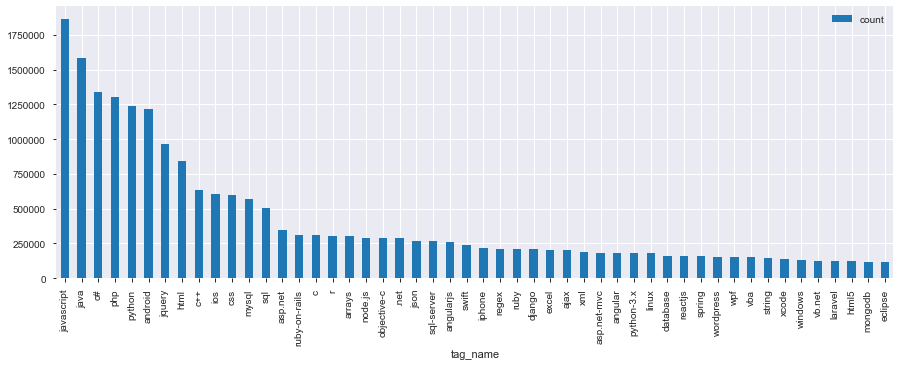

In [17]:
df_tags.iloc[0:50].plot(x='tag_name', y='count', kind='bar', figsize=(15,5));

### Cumulative Frequency of the Most Frequent Tags

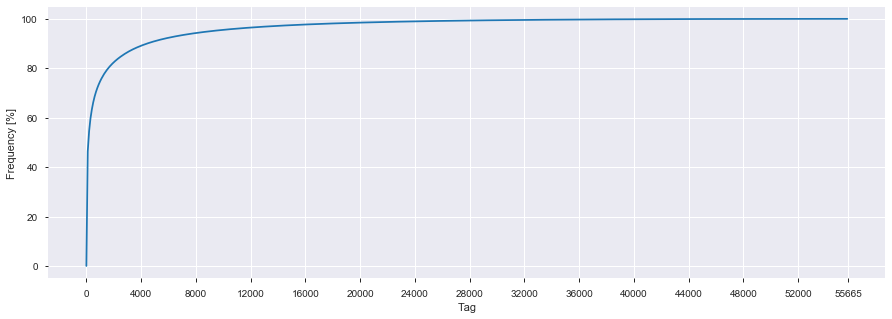

In [18]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
total = df_tags['count'].sum()
y_values = []
x_values = []

for category in range(0, len(df_tags), 100):
    value = df_tags['count'].iloc[0:category].sum()
    y_values.append((value/total)*100)
    x_values.append(category)

ax.plot(x_values, y_values, color='#1f77b4')
ax.set(xlabel='Tag', ylabel='Frequency [%]')
ax.set_xticks(list(range(0,len(df_tags), 4000)) + [len(df_tags)]);

## Posts

In [19]:
query = """SELECT
  *
FROM
  `axa-ch-machine-learning-dev.nlp_text_classification.stackoverflow_posts`"""
df_posts = client.query(query).to_dataframe()

In [20]:
features = ['title', 'body', 'answer_count', 'comment_count', 'favorite_count', 'score', 'tags', 'view_count']
report_features = ['answer_count', 'comment_count', 'favorite_count', 'score', 'tags', 'view_count']

In [21]:
df_posts[features].head()

,title,body,answer_count,comment_count,favorite_count,score,tags,view_count
0,None,<p>Handle the value in a try catch block which...,NaN,0,NaN,0,,NaN
1,None,<p><em>Don't make it too complicated.</em></p>...,NaN,0,NaN,0,,NaN
2,None,<p>You need to match the pinvoke signature to ...,NaN,1,NaN,0,,NaN
3,None,<p>I found a solution: I figured something was...,NaN,0,NaN,0,,NaN
4,None,<p>Look like it was a bug of ADT 21.0.1! Basic...,NaN,0,NaN,0,,NaN


### Report

In [22]:
posts_report = df_posts[report_features].profile_report()

In [23]:
posts_report.to_file(output_file='results/01_reports/posts.html')
posts_report

### Code: Wordcloud

In [24]:
df_posts_subset = df_posts[df_posts['tags'] != '']

In [25]:
langs = df_tags['tag_name'].iloc[0:10]

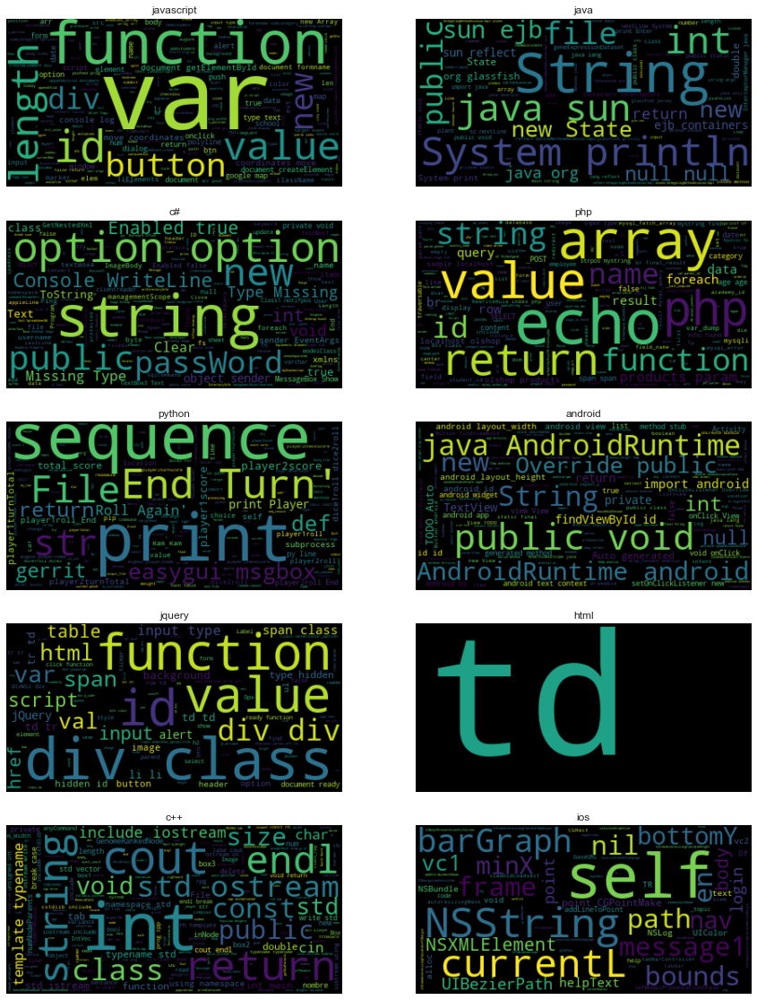

In [26]:
fig = plt.figure(figsize=(15,20))

for lang, num in zip(langs, range(0, len(langs))):
    temp = df_posts_subset[df_posts_subset['tags'] == lang]
    worcloud_temp = create_wordcloud(temp, 'code')
    
    ax = fig.add_subplot(5, 2, num+1)
                         
    ax.imshow(worcloud_temp, interpolation='bilinear')
    ax.set(title=lang)
    ax.axis('off')   

### Post: Wordcloud

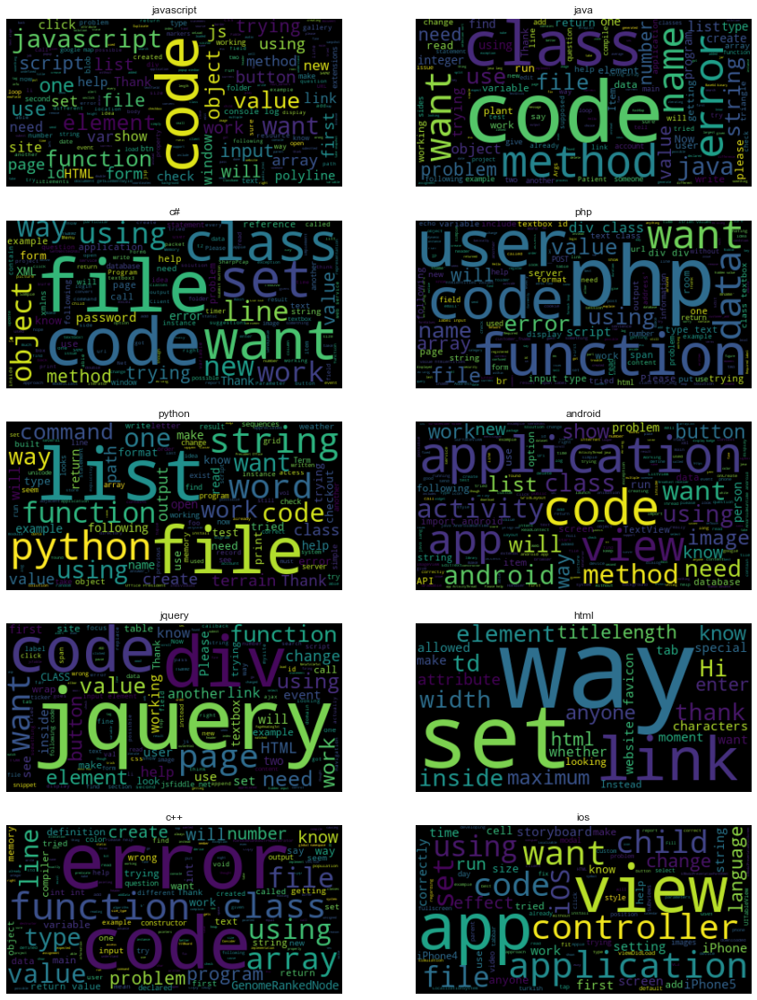

In [27]:
fig = plt.figure(figsize=(15,20))

for lang, num in zip(langs, range(0, len(langs))):
    temp = df_posts_subset[df_posts_subset['tags'] == lang]
    worcloud_temp = create_wordcloud(temp, 'p')
    
    ax = fig.add_subplot(5, 2, num+1)
                         
    ax.imshow(worcloud_temp, interpolation='bilinear')
    ax.set(title=lang)
    ax.axis('off')   

## Questions

In [28]:
query = """SELECT
  *
FROM
  `axa-ch-machine-learning-dev.nlp_text_classification.stackoverflow_posts_questions_small`"""
df_questions = client.query(query).to_dataframe()

In [29]:
features = ['title', 'body', 'answer_count', 'comment_count', 'favorite_count', 'score', 'tags', 'view_count']
report_features = ['answer_count', 'comment_count', 'favorite_count', 'score', 'tags', 'view_count']

In [30]:
df_questions[features].head()

,title,body,answer_count,comment_count,favorite_count,score,tags,view_count
0,how to push my github repo into openshift and ...,<p>i'm newbie to openshift and git.I've my rep...,2,1,NaN,0,gitgithubsftpopenshift,256
1,`Trace: TypeError: React.__spread is not a fun...,<p>I was seeing a warning about this when I wa...,1,15,NaN,0,reactjsreact-reduxbabel,256
2,Append mouseover event to img in a div with jQ...,<p>I am trying to append a mouseover event to ...,1,0,NaN,0,jquery,256
3,Connect on website with HttpWebRequest,<p>I tried to use HttpWebRequest to connect on...,0,3,NaN,0,c#httpwebrequestwebclientwebclient-download,256
4,HTTP outbound gateway - uri variable - encoding,"<p>I have a http outbound gateway, which requi...",0,6,NaN,0,springspring-integrationgatewayoutbound,256


### Report

In [31]:
questions_report = df_questions[report_features].profile_report()

In [32]:
questions_report.to_file(output_file='results/01_reports/questions.html')
questions_report

### Code: Wordcloud

In [33]:
df_questions_subset = df_questions[df_questions['tags'] != '']

In [34]:
langs = df_tags['tag_name'].iloc[0:10]

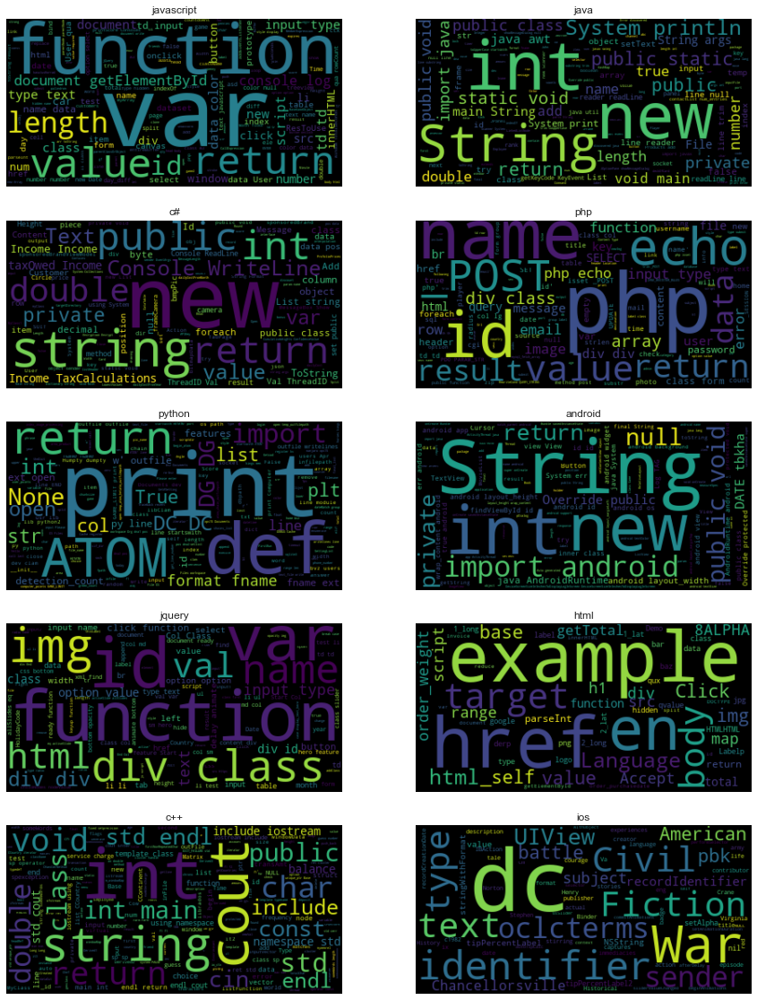

In [35]:
fig = plt.figure(figsize=(15,20))

for lang, num in zip(langs, range(0, len(langs))):
    temp = df_questions_subset[df_questions_subset['tags'] == lang]
    worcloud_temp = create_wordcloud(temp, 'code')
    
    ax = fig.add_subplot(5, 2, num+1)
                         
    ax.imshow(worcloud_temp, interpolation='bilinear')
    ax.set(title=lang)
    ax.axis('off')   

### Posts: Wordcloud

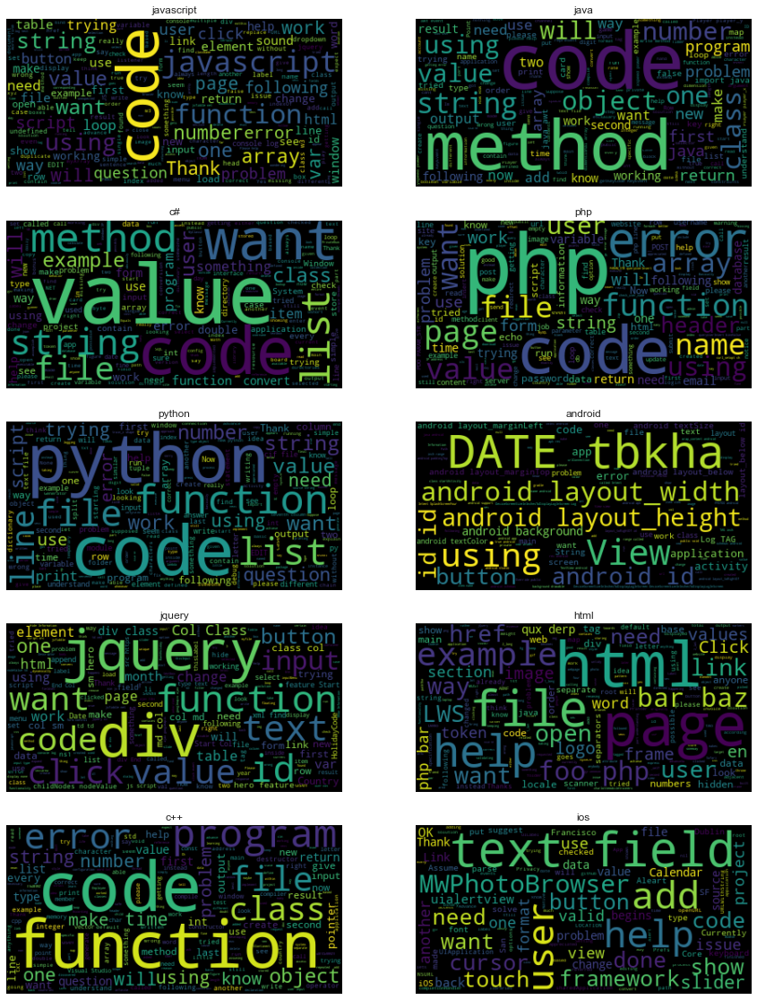

In [36]:
fig = plt.figure(figsize=(15,20))

for lang, num in zip(langs, range(0, len(langs))):
    temp = df_questions_subset[df_questions_subset['tags'] == lang]
    worcloud_temp = create_wordcloud(temp, 'p')
    
    ax = fig.add_subplot(5, 2, num+1)
                         
    ax.imshow(worcloud_temp, interpolation='bilinear')
    ax.set(title=lang)
    ax.axis('off')   

## Complete Posts

In [37]:
query = """SELECT
  *
FROM
  `axa-ch-machine-learning-dev.nlp_text_classification.stackoverflow_posts_complete`"""
df_posts_complete = client.query(query).to_dataframe()

In [38]:
features = ['title', 'body', 'answer_count', 'comment_count', 'favorite_count', 'score', 'tags', 'view_count']
report_features = ['answer_count', 'comment_count', 'favorite_count', 'score', 'tags', 'view_count']

In [39]:
df_posts_complete[features].head()

,title,body,answer_count,comment_count,favorite_count,score,tags,view_count
0,None,<p>You can use REPLACE.</p> <pre><code> Dim x ...,NaN,0,NaN,0,,NaN
1,None,<p>For each line of CSS file try this regexp:<...,NaN,1,NaN,0,,NaN
2,None,<p>It sounds like you might have some conflict...,NaN,9,NaN,0,,NaN
3,None,<p>i cant see on your code something that real...,NaN,0,NaN,0,,NaN
4,None,<p>I am not sure I understood everything but i...,NaN,0,NaN,0,,NaN


### Report

In [40]:
posts_complete_report = df_posts_complete[report_features].profile_report()

In [41]:
posts_complete_report.to_file(output_file='results/01_reports/posts_complete.html')
posts_complete_report

### Code: Wordcloud

In [42]:
df_posts_complete_subset = df_posts_complete[df_posts_complete['tags'] != '']

In [43]:
langs = df_tags['tag_name'].iloc[0:10]

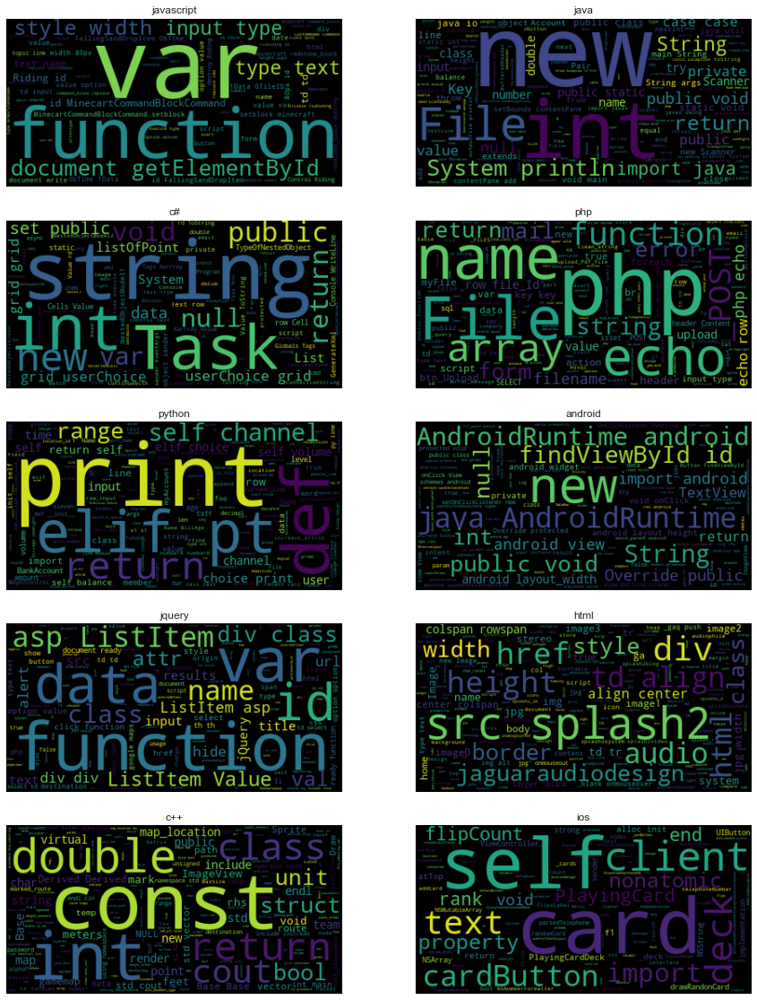

In [44]:
fig = plt.figure(figsize=(15, 20))

for lang, num in zip(langs, range(0, len(langs))):
    temp = df_posts_complete_subset[df_posts_complete_subset['tags'] == lang]
    worcloud_temp = create_wordcloud(temp, 'code')

    ax = fig.add_subplot(5, 2, num+1)

    ax.imshow(worcloud_temp, interpolation='bilinear')
    ax.set(title=lang)
    ax.axis('off')

### Posts: Wordcloud

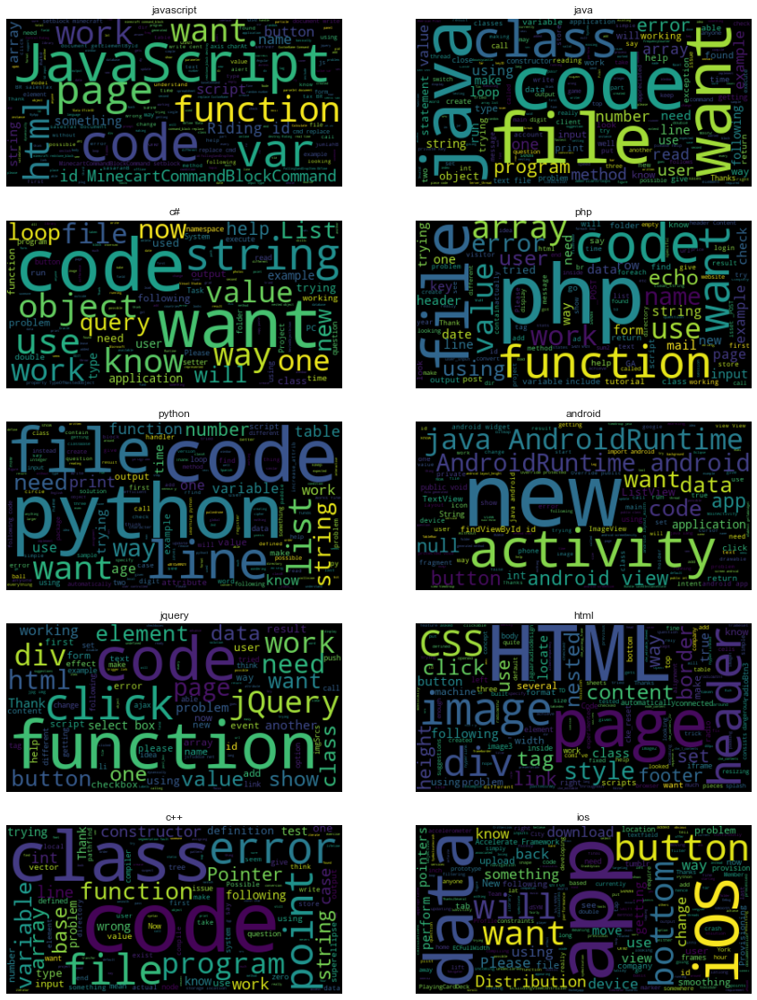

In [45]:
fig = plt.figure(figsize=(15,20))

for lang, num in zip(langs, range(0, len(langs))):
    temp = df_posts_complete_subset[df_posts_complete_subset['tags'] == lang]
    worcloud_temp = create_wordcloud(temp, 'p')
    
    ax = fig.add_subplot(5, 2, num+1)
                         
    ax.imshow(worcloud_temp, interpolation='bilinear')
    ax.set(title=lang)
    ax.axis('off')

### How Many Posts Do Have a Codeblock?

In [46]:
df_posts_complete_subset = df_posts_complete[df_posts_complete['tags'] != '']

In [47]:
def code_block_number(string):
    soup = BeautifulSoup(string, 'html.parser')
    obj_array = soup.find_all('code')

    return(len(obj_array))

In [48]:
df_posts_complete_subset['codeblocks'] = df_posts_complete_subset['body'] \
                                            .apply(lambda string: code_block_number(string))

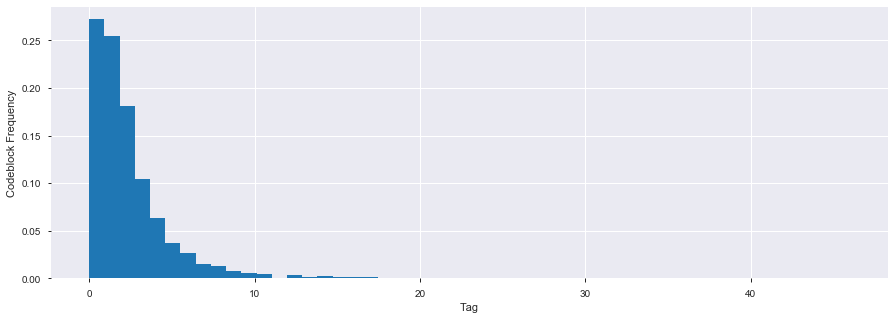

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

df_posts_complete_subset['codeblocks'].plot(kind='hist', bins=50, 
                                            weights=np.zeros_like(df_posts_complete_subset['codeblocks']) \
                                            + 1. / df_posts_complete_subset['codeblocks'].size);

ax.set(xlabel='Tag', ylabel='Codeblock Frequency');

### How Much Tags Are There Per Post?

In [50]:
df_posts_complete_subset['tag_count'] = df_posts_complete_subset['tags'].apply(lambda tags: len(split_tags(tags)))

In [51]:
df_posts_complete_subset['tag_count'].describe()

count    11921.000000
mean         2.964936
std          1.198270
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: tag_count, dtype: float64

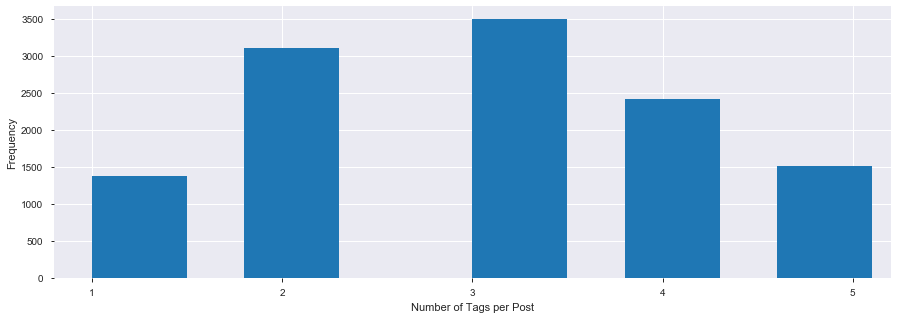

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

ax.hist(df_posts_complete_subset['tag_count'], width=0.5)

ax.set(xlabel='Number of Tags per Post', xticks=range(1,6), ylabel='Frequency');